# Прогноз температуры стали во время плавки

### Описание проекта

Для оптимизации производственных расходов металлургический комбинат решил уменьшить потребление электроэнергии на этапе обработки стали. Необходимо построить модель, которая предскажет температуру стали.

### План проекта

    1. Исследовательский анализ данных
    2. Предобработка данных
    3. Построение моделей
    4. Тестирование лучшей модели на лучшем наборе признаков
    5. Анализ важности факторов
    6. Выводы

### Описание данных

Данные состоят из файлов, полученных из разных источников: данные об электродах, о подаче сыпучих/проволочных материалов, о продувке сплава газом, результаты измерения температуры. Во всех файлах столбец key содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки.

## 1. Исследовательский анализ данных

In [1]:
#загрузка необходимых библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
from datetime import timedelta

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

!pip install pandas-profiling
import pandas_profiling

!pip install lightgbm
from lightgbm import LGBMRegressor

!pip install shap
import shap

In [2]:
#загружаем датсеты
#данные об электродах:
try:
    data_arc = pd.read_csv('data_arc.csv')
except:
    data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
#данные о подаче сыпучих материалов (объём):
try:
    data_bulk = pd.read_csv('data_bulk.csv')
except:
    data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
#данные о подаче сыпучих материалов (время):
try:
    data_bulk_time = pd.read_csv('data_bulk_time.csv')
except:
    data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
#данные о продувке сплава газом:
try:
    data_gas = pd.read_csv('data_gas.csv')
except:
    data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
#результаты измерения температуры:
try:
    data_temp = pd.read_csv('data_temp.csv')
except:
    data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
#данные о проволочных материалах (объём):
try:
    data_wire = pd.read_csv('data_wire.csv')
except:
    data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
#данные о проволочных материалах (время):
try:
    data_wire_time = pd.read_csv('data_wire_time.csv')
except:
    data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

In [3]:
#посмотрим подробнее данные об электродах:
data_arc.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии, начало и конец нагрева, а также активная и реактивная мощности
    2) Всего указаны данные для 3214 партии
    3) Пропущенных значений и дубликатов нет
    4) В указаниии реактивной мощности присутствует аномальное значние (-715)
    5) Значения активной и реактивной мощностей сильно коррелируют друг с другом (коэффициент = 0.969)
    6) Распределение активной мощности имеет форму, похожую на логнормальное распределение

In [4]:
#посмотрим подробнее данные о подаче сыпучих материалов (объем):
data_bulk.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии и 15 столбцов bulk со значениями добавленных объемов сыпучих материалов
    2) Всего указаны данные для 3129 партий
    3) Дубликатов нет
    4) Имеется большое количество пропущенных значений (71,5% всех значений)
    4) Основное количество значений указаны в столбцах Bulk 3, Bulk 4, Bulk 12, Bulk 14, Bulk 15

In [5]:
#посмотрим подробнее данные о подаче сыпучих материалов (время):
data_bulk_time.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии и 15 столбцов bulk с указанием времени добавления сыпучих материалов
    2) Всего указаны данные для 3129 партий
    3) Дубликатов нет
    4) Имеется большое количество пропущенных значений (71,5% всех значений)
    5) Основное количество значений указаны в столбцах Bulk 3, Bulk 4, Bulk 12, Bulk 14, Bulk 15

In [6]:
#посмотрим подробнее данные о продувке сплава газом:
data_gas.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии и данные о продувке газом (Газ 1)
    2) Всего указаны данные для 3239 партии
    3) Пропущенных значений и дубликатов нет
    4) Распределения значений газа похоже на нормальное распределение с очень длинным правым хвостом (95% меньше 22,6, а максимальное указанное значение - 77,99)

In [7]:
#посмотрим подробнее результаты измерения температуры:
data_temp.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии, время замера и температура
    2) Всего указаны данные для 3216 партий
    3) Дубликатов нет
    4) В значениях температуры есть пропущенные значения (2901 значение, 18% от общего числа)
    5) Распределения значений температуры похоже на нормальное распределение

In [8]:
#посмотрим подробнее данные о проволочных материалах (объём):
data_wire.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии и 9 столбцов с указанием объемов проволочных материалов
    2) Всего указаны данные для 3081 партий
    3) Дубликатов нет
    4) Имеется большое количество пропущенных значений (75,9% всех значений)
    5) Основное количество значений указаны в столбцах Wire 1, Wire 2

In [9]:
#посмотрим подробнее данные о проволочных материалах (время):
data_wire_time.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы:**:

    1) В данных указаны: номер партии и 9 столбцов с указанием времени добавления проволочных материалов
    2) Всего указаны данные для 3081 партий
    3) Дубликатов нет
    4) Имеется большое количество пропущенных значений (75,9% всех значений)
    5) Основное количество значений указаны в столбцах Wire 1, Wire 2

## 2. Предобработка данных

In [10]:
#исключим аномальное значение реактивной мощности:
data_arc = data_arc[data_arc['Реактивная мощность']!= data_arc['Реактивная мощность'].min()]

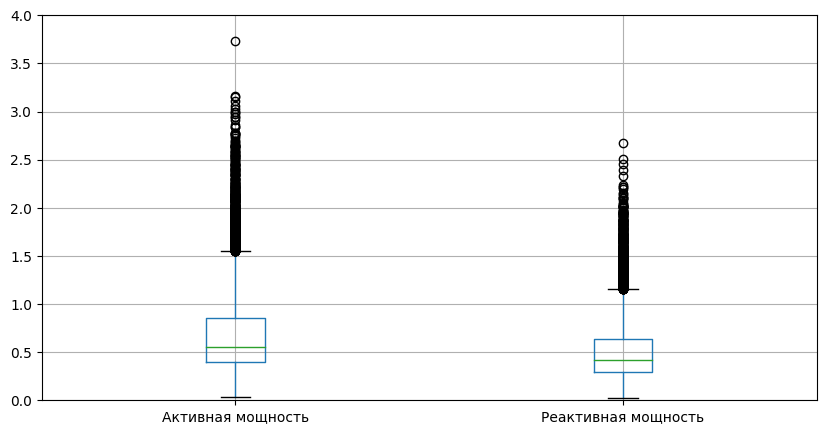

In [11]:
# построим ящики с усами для значений активной и реактивной мощностей:
ax = data_arc.boxplot(column=['Активная мощность', 'Реактивная мощность'], figsize=(10,5))
ax.set(ylim=(0,4))
plt.show()

**Вывод:** Явных аномалий нет. Присутствующие выбросы могут являться реальными измерениями.

In [12]:
#создадим новый датафрейм из нулей со столбцами, содержащими следующие данные по электродам: 
#номер партии, сумма полных мощностей, средняя полная мощность, работа
data_arc_key = pd.DataFrame(0, columns=['key', 'summ_full_power', 'mean_full_power', 'job'], index=range(0, len(data_arc['key'].unique())))

In [13]:
# заполним столбец с номерами партий
data_arc_key['key'] = data_arc['key'].unique()

In [14]:
# заполним столбец с суммами полных мощностей:
for i in data_arc['key'].unique():
    data_arc_key.loc[data_arc_key['key']==i, 'summ_full_power'] = sum((data_arc.loc[data_arc['key']==i, 'Активная мощность']**2 \
                                                            +data_arc.loc[data_arc['key']==i, 'Реактивная мощность']**2)**(0.5))

In [15]:
# заполним столбец с средней полной мощностью:
for i in data_arc['key'].unique():
    data_arc_key.loc[data_arc_key['key']==i, 'mean_full_power'] = data_arc_key.loc[data_arc_key['key']==i, 'summ_full_power']/ \
                                                                  data_arc.loc[data_arc['key']==i, 'key'].count()

In [16]:
# заполним столбец с работой:
# для этого приведем столбцы с указанием начала и конца нагрева дугой в нужный формат:
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])
# создадим дополнительный столбец с указанием длительности нагрева в секундах:
data_arc['duration'] = ''
for i in data_arc.index:
    data_arc.loc[i, 'duration'] = (data_arc.loc[i, 'Конец нагрева дугой']-data_arc.loc[i, 'Начало нагрева дугой']).total_seconds()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [17]:
#заполним столбец с работой:
for i in data_arc['key'].unique():
    data_arc_key.loc[data_arc_key['key']==i, 'job'] = sum((data_arc.loc[data_arc['key']==i, 'Активная мощность']**2\
                                                           +data_arc.loc[data_arc['key']==i, 'Реактивная мощность']**2)**(0.5)\
                                                          *data_arc.loc[data_arc['key']==i, 'duration'])

In [18]:
# выведем первые 5 строк получившейся таблицы для ознакомления:
data_arc_key.head()

,key,summ_full_power,mean_full_power,job
0,1,5.826395,1.165279,1442.377754
1,2,3.649216,0.912304,881.233565
2,3,2.989534,0.597907,525.066777
3,4,3.814962,0.953741,796.911309
4,5,4.035758,1.008939,1199.137958


In [19]:
#создадим новый датафрейм из нулей со столбцами, содержащими следующие данные по температуре: 
#номер партии, начальная температура, итоговая температура:
data_temp_key = pd.DataFrame(0, columns=['key', 'start_temp', 'final_temp'], index=range(0, len(data_temp['key'].unique())))

In [20]:
# заполним столбец с номерами партий
data_temp_key['key'] = data_temp['key'].unique()

In [21]:
#заполним соответствующие столбцы с температурами:
for i in data_temp['key'].unique():
    if data_temp[data_temp['key']==i].shape[0]>2:
        data_temp_key.loc[data_temp_key['key']==i, 'start_temp'] = data_temp[data_temp['key']==i].iloc[0]['Температура']
        data_temp_key.loc[data_temp_key['key']==i, 'final_temp'] = data_temp[data_temp['key']==i].iloc[-1]['Температура']
    else:
        data_temp_key.loc[data_temp_key['key']==i, 'key'] =0

In [22]:
# определим процент некорректных партий (где меньше или всего 2 измерения температуры):
data_temp_key[data_temp_key['key']==0].shape[0]/data_temp_key.shape[0]*100

2.4875621890547266

In [23]:
# исключим некорректные партии (где меньше или всего 2 измерения температуры):
data_temp_key = data_temp_key[data_temp_key['key']!=0]

In [24]:
# определим, есть ли пропущенные значения в итоговой таблице:
data_temp_key.isna().sum()

key             0
start_temp      0
final_temp    717
dtype: int64

In [25]:
# исключим пропуски(так как целевой признак - это как раз финальная температура):
data_temp_key = data_temp_key.dropna()

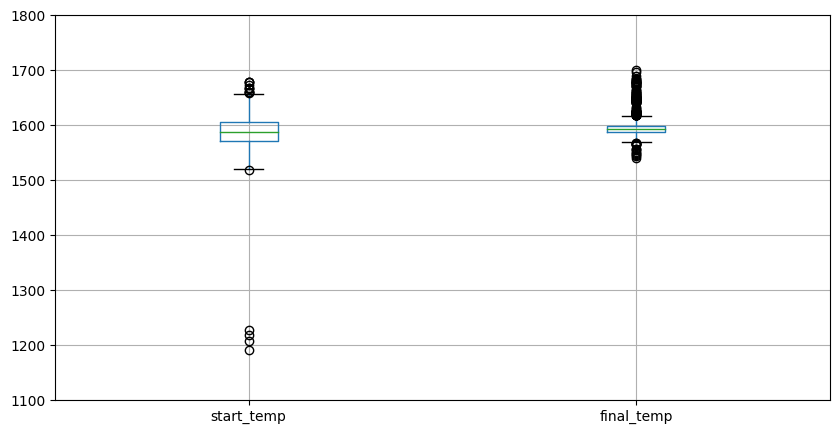

In [26]:
# построим ящики с усами для значений начальной и финальной температур:
ax = data_temp_key.boxplot(column=['start_temp', 'final_temp'], figsize=(10,5))
ax.set(ylim=(1100,1800))
plt.show()

In [27]:
# исключим партии с аномальными значениями стартовой температуры (менее 1300):
data_temp_key = data_temp_key[data_temp_key['start_temp']>1300]

In [28]:
# выведем первые 5 строк получившейся таблицы для ознакомления:
data_temp_key.head()

,key,start_temp,final_temp
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
5,6,1543.0,1596.0


In [29]:
data_temp_key

,key,start_temp,final_temp
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
5,6,1543.0,1596.0
...,...,...,...
2471,2494,1585.0,1591.0
2472,2495,1570.0,1591.0
2473,2496,1554.0,1591.0
2475,2498,1591.0,1594.0


In [30]:
#заменим пропущенные значения в данных о подаче сыпучих материалов (объём) на 0:
data_bulk = data_bulk.fillna(0)

In [31]:
#добавим в исходную таблицу с данными о подаче сыпучих материалов (объем) столбцы с суммой всех объемов для каждой партии 
#и с суммой объемов для редких Bulk (1-11, 13):
data_bulk['sum_bulk'] = data_bulk['Bulk 1']+data_bulk['Bulk 2']+data_bulk['Bulk 3']+data_bulk['Bulk 4']+data_bulk['Bulk 5']+\
                   data_bulk['Bulk 6']+data_bulk['Bulk 7']+data_bulk['Bulk 8']+\
                   data_bulk['Bulk 9']+data_bulk['Bulk 10']+data_bulk['Bulk 11']+\
                   data_bulk['Bulk 12']+data_bulk['Bulk 13']+data_bulk['Bulk 14']+data_bulk['Bulk 15']
data_bulk['other_bulk'] = data_bulk['Bulk 1']+data_bulk['Bulk 2']+data_bulk['Bulk 3']+data_bulk['Bulk 4']+data_bulk['Bulk 5']+\
                   data_bulk['Bulk 6']+data_bulk['Bulk 7']+data_bulk['Bulk 8']+\
                   data_bulk['Bulk 9']+data_bulk['Bulk 10']+data_bulk['Bulk 11']+data_bulk['Bulk 13'] 

In [32]:
# выведем первые 5 строк получившейся таблицы для ознакомления:
data_bulk.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,sum_bulk,other_bulk
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,553.0,43.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,582.0,73.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,544.0,34.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,595.0,81.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,584.0,78.0


In [33]:
#заменим пропущенные значения в данных о подаче проволочных материалов (объём) на 0:
data_wire = data_wire.fillna(0)

In [34]:
#добавим в исходную таблицу с данными о подаче проволочных материалов (объем) столбцы с суммой всех объемов для каждой партии 
#и с суммой объемов для редких Wire(2-9):
data_wire['sum_wire'] = data_wire['Wire 1']+data_wire['Wire 2']+data_wire['Wire 3']+data_wire['Wire 4']+data_wire['Wire 5']+\
                   data_wire['Wire 6']+data_wire['Wire 7']+data_wire['Wire 8']+data_wire['Wire 9']
data_wire['other_wire'] = data_wire['Wire 2']+data_wire['Wire 3']+data_wire['Wire 4']+data_wire['Wire 5']+\
                   data_wire['Wire 6']+data_wire['Wire 7']+data_wire['Wire 8']+data_wire['Wire 9']

In [35]:
# выведем первые 5 строк получившейся таблицы для ознакомления:
data_wire.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9,sum_wire,other_wire
0,1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.059998,0.00000
1,2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,96.052315,0.00000
2,3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91.160157,0.00000
3,4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,89.063515,0.00000
4,5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0,98.352796,9.11456


In [36]:
#выведем данные обо всех датафреймах, которые необходимо объединить для дальнейшего анализа:
print(data_arc_key.shape, data_bulk.shape, data_gas.shape, data_temp_key.shape, data_wire.shape)

(3214, 4) (3129, 18) (3239, 2) (2415, 3) (3081, 12)


In [37]:
#объединим все необходимые данные по партиям в один датафрйм:
data_full = data_temp_key.merge(data_arc_key, on='key', how='inner')\
                .merge(data_bulk[['key', 'sum_bulk', 'Bulk 12', 'Bulk 14', 'Bulk 15', 'other_bulk']], on='key', how='inner')\
                .merge(data_gas, on='key', how='inner')\
                .merge(data_wire[['key', 'sum_wire', 'Wire 1', 'other_wire']], on='key', how='inner')

In [38]:
# выведем первые 5 строк объединенной таблицы для ознакомления:
data_full.head()

,key,start_temp,final_temp,summ_full_power,mean_full_power,job,sum_bulk,Bulk 12,Bulk 14,Bulk 15,other_bulk,Газ 1,sum_wire,Wire 1,other_wire
0,1,1571.0,1613.0,5.826395,1.165279,1442.377754,553.0,206.0,150.0,154.0,43.0,29.749986,60.059998,60.059998,0.00000
1,2,1581.0,1602.0,3.649216,0.912304,881.233565,582.0,206.0,149.0,154.0,73.0,12.555561,96.052315,96.052315,0.00000
2,3,1596.0,1599.0,2.989534,0.597907,525.066777,544.0,205.0,152.0,153.0,34.0,28.554793,91.160157,91.160157,0.00000
3,4,1601.0,1625.0,3.814962,0.953741,796.911309,595.0,207.0,153.0,154.0,81.0,18.841219,89.063515,89.063515,0.00000
4,6,1543.0,1596.0,4.786837,1.196709,1410.747219,676.0,204.0,201.0,154.0,117.0,11.273392,108.224477,99.109917,9.11456


In [39]:
#проверим размерность получившейся таблицы:
data_full.shape

(2278, 15)

In [40]:
#проверим наличие пропусков:
data_full.isna().sum()

key                0
start_temp         0
final_temp         0
summ_full_power    0
mean_full_power    0
job                0
sum_bulk           0
Bulk 12            0
Bulk 14            0
Bulk 15            0
other_bulk         0
Газ 1              0
sum_wire           0
Wire 1             0
other_wire         0
dtype: int64

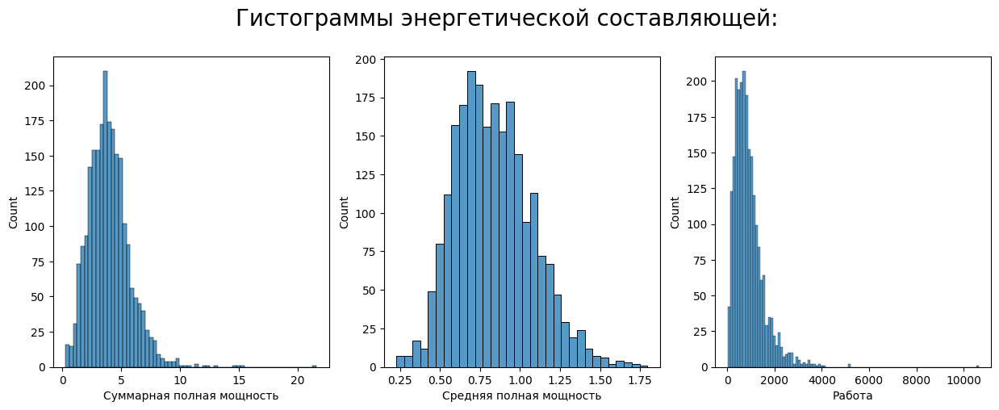

In [41]:
# построим гистограммы энергетической составляющей:
fig, ax = plt.subplots(figsize=(15, 5))
fig.suptitle('Гистограммы энергетической составляющей:', y = 1, fontsize = 20)
plt.subplot(1, 3, 1)
s1 = sns.histplot(x='summ_full_power', data=data_full)
plt.subplot(1, 3, 2)
s2 = sns.histplot(x='mean_full_power', data=data_full)
plt.subplot(1, 3, 3)
s3 = sns.histplot(x='job', data=data_full)
s1.set_xlabel("Суммарная полная мощность")
s2.set_xlabel("Средняя полная мощность")
s3.set_xlabel("Работа");

**Вывод**: из графиков видно, что средняя полная мощность имеет более пологий вид гистограммы, суммарная полная мощность более сосредоточенный купол, а работа явно выраженный пик.

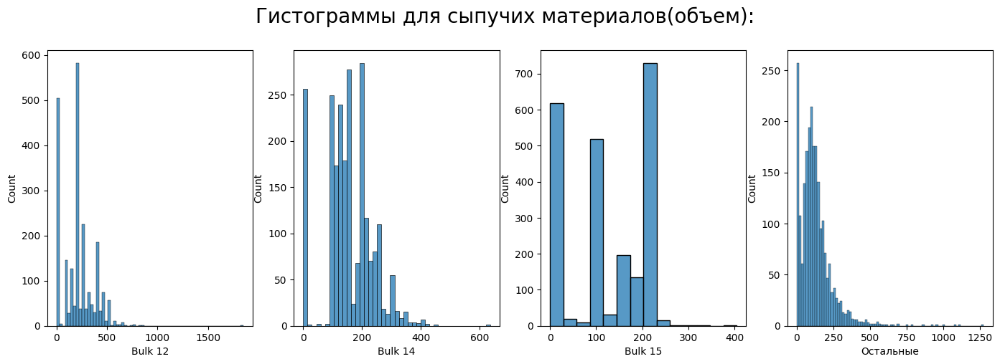

In [42]:
# построим гистограммы для Bulk 12, 14, 15 и other:
fig, ax = plt.subplots(figsize=(17, 5))
fig.suptitle('Гистограммы для сыпучих материалов(объем):', y = 1, fontsize = 20)
plt.subplot(1, 4, 1)
s1 = sns.histplot(x='Bulk 12', data=data_full)
plt.subplot(1, 4, 2)
s2 = sns.histplot(x='Bulk 14', data=data_full)
plt.subplot(1, 4, 3)
s3 = sns.histplot(x='Bulk 15', data=data_full)
plt.subplot(1, 4, 4)
s3 = sns.histplot(x='other_bulk', data=data_full)
s1.set_xlabel("Bulk 12")
s2.set_xlabel("Bulk 14")
s3.set_xlabel("Bulk 15")
s3.set_xlabel("Остальные");

**Вывод**: Из графиков видно, что гистограммы для Bulk 12, 14 и 15 имеют отличительные черты, о гистограмма с суммой остальных уже более похожа на нормальное распределение, а эта зависимость отображается через сумму объемов всех поданных сыпучих материалов, т.е. использвать в дальнейшем вместе с признаками Bulk 12, 14, 15 нет смысла, лучше использовать тогда просто сумму

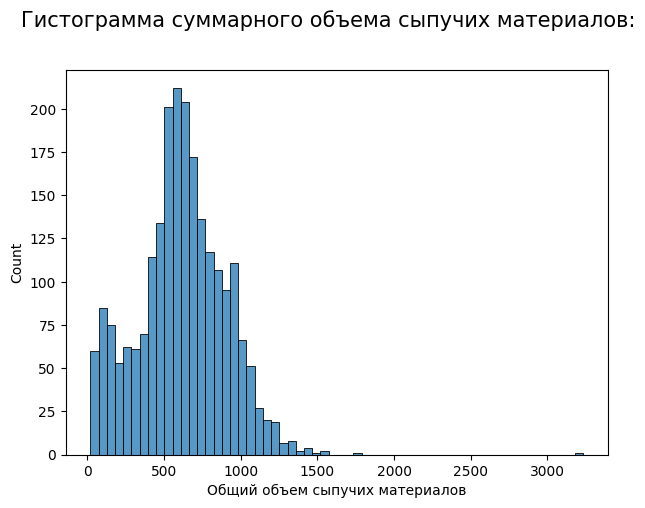

In [43]:
# построим гистограмму для суммарного объема сыпучих материалов:
fig, ax = plt.subplots(figsize=(7, 5))
fig.suptitle('Гистограмма суммарного объема сыпучих материалов:', y = 1, fontsize = 15)
s1 = sns.histplot(x='sum_bulk', data=data_full)
s1.set_xlabel("Общий объем сыпучих материалов");

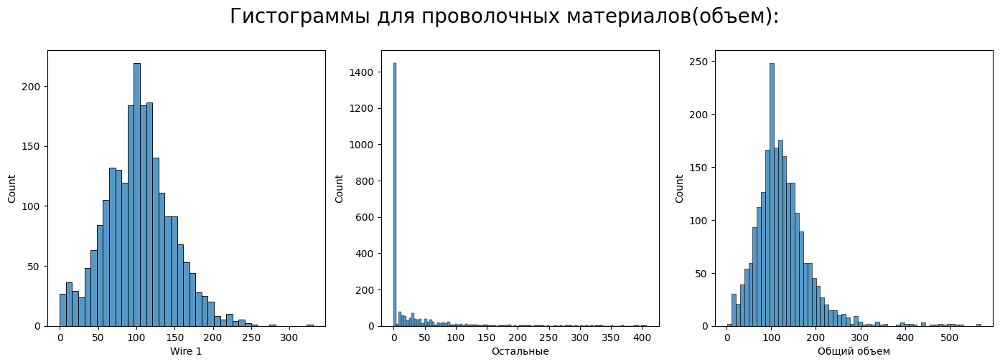

In [44]:
# построим гистограммы для данных о проволочных материлах (объем):
fig, ax = plt.subplots(figsize=(17, 5))
fig.suptitle('Гистограммы для проволочных материалов(объем):', y = 1, fontsize = 20)
plt.subplot(1, 3, 1)
s1 = sns.histplot(x='Wire 1', data=data_full)
plt.subplot(1, 3, 2)
s2 = sns.histplot(x='other_wire', data=data_full)
plt.subplot(1, 3, 3)
s3 = sns.histplot(x='sum_wire', data=data_full)
s1.set_xlabel("Wire 1")
s2.set_xlabel("Остальные")
s3.set_xlabel("Общий объем");

**Вывод:** Информативность признака в виде остальной суммы объемов проволоных материалов нет смысла, поэтому в дальнейшем будем в виде признака использовать либо данные по Wire 1, либо суммарные данные

In [45]:
# удаляем неинформативные столбцы из финального датасета признаков:
data_full = data_full.drop(columns=['key', 'other_bulk', 'Wire 1', 'other_wire'])

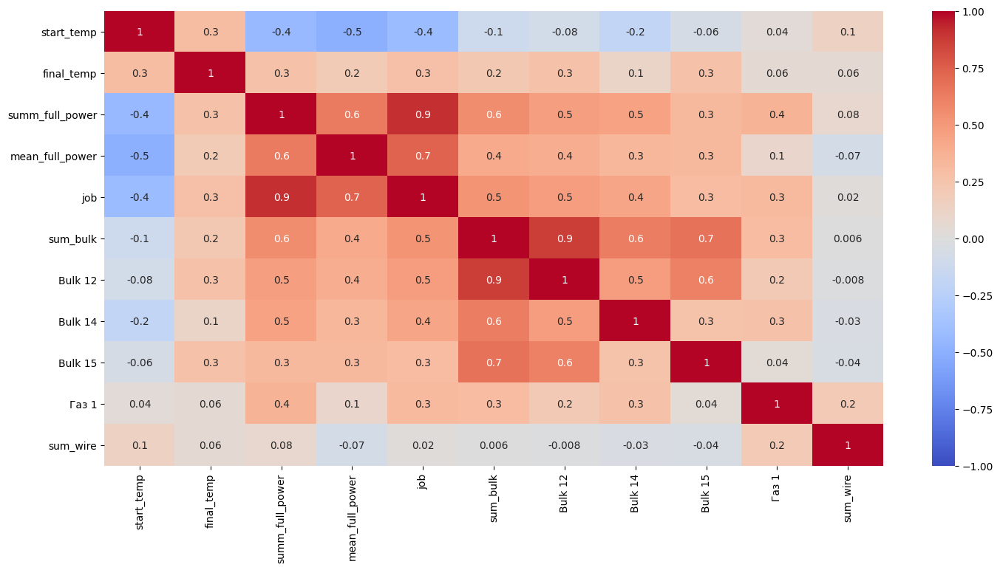

In [46]:
# построим тепловую карту для коэффициентов корреляции признаков итогового датафрейма:
fig, ax = plt.subplots(figsize=(17, 8))
sns.heatmap(data_full.corr(), annot=True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm');

**Выводы**: из анализа тепловой карты можно предположить о существовании следующих связей (далее подробнее рассмотрим их на соответвующих графиках):

        1) небольшая положительная связь между начальной и финальной температурами;
        2) небольшая отрицательная связь между начальной температурой и энергетической составляющей;
        3) небольшая положительная связь между энергетической составляющей и финальной температурой;
        4) небольшая положительная связь между объемом сыпучих веществ и финальной температурой

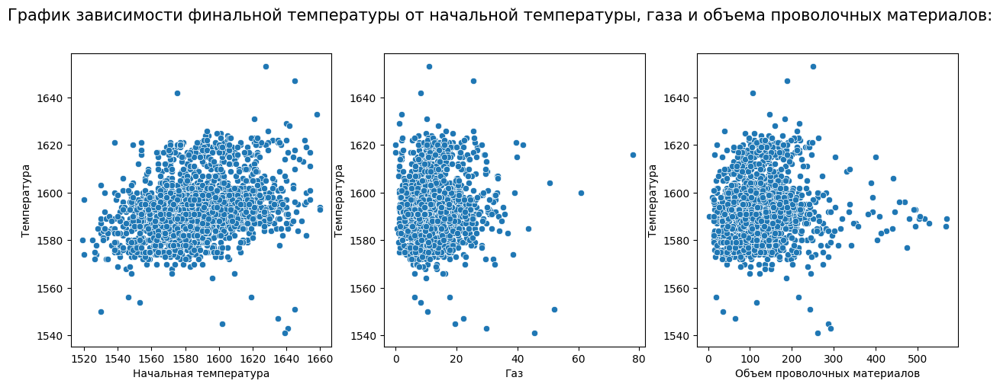

In [47]:
fig, ax = plt.subplots(figsize=(15, 5))
fig.suptitle('График зависимости финальной температуры от начальной температуры, газа и объема проволочных материалов:', y = 1, fontsize = 15)
plt.subplot(1, 3, 1)
s1 = sns.scatterplot(x='start_temp', y='final_temp', data=data_full)
plt.subplot(1, 3, 2)
s2 = sns.scatterplot(x='Газ 1', y='final_temp', data=data_full)
plt.subplot(1, 3, 3)
s3 = sns.scatterplot(x='sum_wire', y='final_temp', data=data_full)
s1.set_xlabel("Начальная температура")
s2.set_xlabel("Газ")
s3.set_xlabel("Объем проволочных материалов")
s1.set_ylabel("Температура")
s2.set_ylabel("Температура")
s3.set_ylabel("Температура");

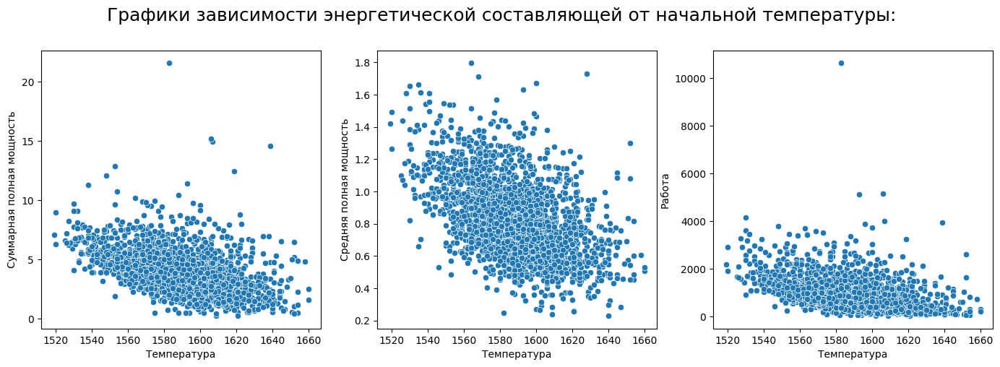

In [48]:
fig, ax = plt.subplots(figsize=(17, 5))
fig.suptitle('Графики зависимости энергетической составляющей от начальной температуры:', y = 1, fontsize = 18)
plt.subplot(1, 3, 1)
s1 = sns.scatterplot(x='start_temp', y='summ_full_power', data=data_full)
plt.subplot(1, 3, 2)
s2 = sns.scatterplot(x='start_temp', y='mean_full_power', data=data_full)
plt.subplot(1, 3, 3)
s3 = sns.scatterplot(x='start_temp', y='job', data=data_full)
s1.set_xlabel("Температура")
s2.set_xlabel("Температура")
s3.set_xlabel("Температура")
s1.set_ylabel("Суммарная полная мощность")
s2.set_ylabel("Средняя полная мощность")
s3.set_ylabel("Работа");

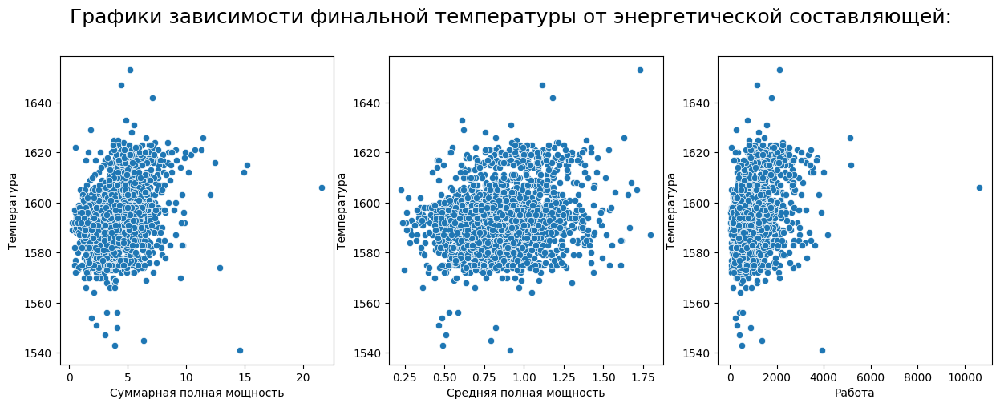

In [49]:
fig, ax = plt.subplots(figsize=(15, 5))
fig.suptitle('Графики зависимости финальной температуры от энергетической составляющей:', y = 1, fontsize = 18)
plt.subplot(1, 3, 1)
s1 = sns.scatterplot(x='summ_full_power', y='final_temp', data=data_full)
plt.subplot(1, 3, 2)
s2 = sns.scatterplot(x='mean_full_power', y='final_temp', data=data_full)
plt.subplot(1, 3, 3)
s3 = sns.scatterplot(x='job', y='final_temp', data=data_full)
s1.set_xlabel("Суммарная полная мощность")
s2.set_xlabel("Средняя полная мощность")
s3.set_xlabel("Работа")
s1.set_ylabel("Температура")
s2.set_ylabel("Температура")
s3.set_ylabel("Температура");

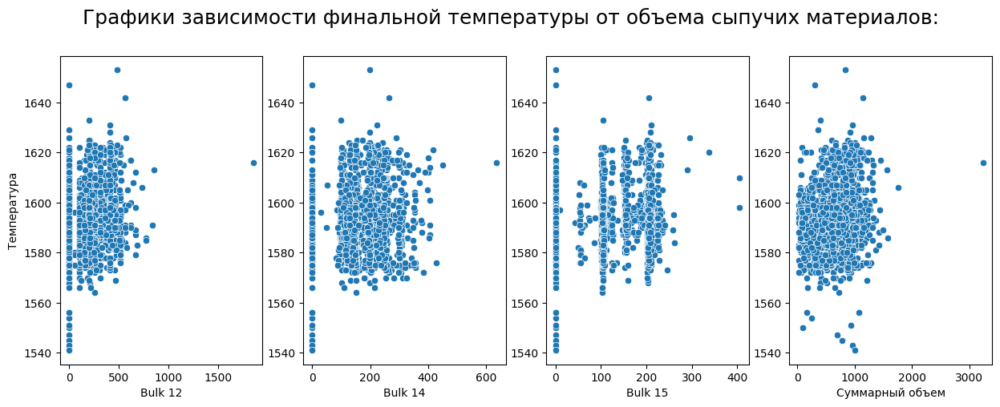

In [50]:
fig, ax = plt.subplots(figsize=(15, 5))
fig.suptitle('Графики зависимости финальной температуры от объема сыпучих материалов:', y = 1, fontsize = 18)
plt.subplot(1, 4, 1)
s1 = sns.scatterplot(x='Bulk 12', y='final_temp', data=data_full)
plt.subplot(1, 4, 2)
s2 = sns.scatterplot(x='Bulk 14', y='final_temp', data=data_full)
plt.subplot(1, 4, 3)
s3 = sns.scatterplot(x='Bulk 15', y='final_temp', data=data_full)
plt.subplot(1, 4, 4)
s4 = sns.scatterplot(x='sum_bulk', y='final_temp', data=data_full)
s1.set_xlabel("Bulk 12")
s2.set_xlabel("Bulk 14")
s3.set_xlabel("Bulk 15")
s4.set_xlabel("Суммарный объем")
s1.set_ylabel("Температура")
s2.set_ylabel("")
s3.set_ylabel("")
s4.set_ylabel("");

In [51]:
features_set = [['start_temp', 'summ_full_power', 'sum_bulk', 'Газ 1', 'sum_wire'], \
                ['start_temp', 'summ_full_power', 'Bulk 12', 'Bulk 14', 'Bulk 15', 'Газ 1', 'sum_wire'], \
                ['start_temp', 'mean_full_power', 'sum_bulk', 'Газ 1', 'sum_wire'], \
                ['start_temp', 'mean_full_power', 'Bulk 12', 'Bulk 14', 'Bulk 15', 'Газ 1', 'sum_wire'], \
                ['start_temp', 'job', 'sum_bulk', 'Газ 1', 'sum_wire'], \
                ['start_temp', 'job', 'Bulk 12', 'Bulk 14', 'Bulk 15', 'Газ 1', 'sum_wire']]

**Выводы**: из анализа тепловой карты и графиков:

        1) просматривается несильная положительная связь между начальной и финальной температурами;
        2) просматривается отрицательная связь между начальной температурой и энергетической составляющей;
        3) просматривается небольшая положительная связь между энергетической составляющей и финальной температурой на графиках с суммами полных мощностей и работой, а вот на графике со средней полной мощностью взаимосвязь отследить труднее;
        4) просматривается небольшая положительная связь между объемом сыпучих веществ (суммой) и финальной температурой, а вот из графиков объемов по Bulk взаимосвязь не отслеживается.

In [52]:
# разделим данные на признаки и целевой признак
features = data_full.drop(['final_temp'], axis=1)
target = data_full['final_temp']

In [53]:
# разделим данные на обучающую и тестовую выборки
features_train, features_test, target_train, target_test = train_test_split(features, target, random_state=100423, test_size=0.25)

## 3. Построение моделей

In [54]:
# саздадим таблицу, содержащую оценки MAE работы разных моделей на разных наборах признаков:
mae_table = pd.DataFrame(-1, columns=['set_1', 'set_2', 'set_3', 'set_4', 'set_5', 'set_6'], \
                         index=['LinearRegression', 'RandomForestRegressor', 'LGBMRegressor'])

In [55]:
# модель линейной регресии:
# список, в котором сохраним модели линейной регресии, обученные на разных наборах признаков:
model_linear_set = []
# обучим модели линейной регрессии:
for i in range(0, 6):
    model_linear = Pipeline([('scaler', StandardScaler()), \
                             ('model',LinearRegression())])
    mae_linear = cross_val_score(model_linear, features_train[features_set[i]], \
                                                target_train, cv=5, scoring='neg_mean_absolute_error')
    mae_table.loc['LinearRegression', 'set_{0}'.format(i+1)] = abs(round(mae_linear.mean(), 2))
    model_linear_set.append(model_linear)

In [56]:
# модель случайного леса:
# список, в котором сохраним модели случайного леса, обученные на разных наборах признаков:
model_forest_set = []
# набор гиперпараметров:
params = {'n_estimators': [50, 75, 100, 150],
         'max_depth': [15, 20, 25, 30]} 
# обучим модели случайного леса:
for i in range(0, 6):
    model_forest = RandomizedSearchCV(RandomForestRegressor(random_state=100423), params, scoring='neg_mean_absolute_error', \
                                      random_state=100423, cv=5)
    model_forest.fit(features_train[features_set[i]], target_train)
    mae_table.loc['RandomForestRegressor', 'set_{0}'.format(i+1)] = abs(round(model_forest.best_score_, 2))
    model_forest_set.append(model_forest)

In [57]:
# модель LGBMRegressor:
# список, в котором сохраним модели LGBMRegressor, обученные на разных наборах признаков:
model_lbr_set = []
# набор гиперпараметров:
params = {'max_depth': [15, 20, 25, 30],
          'learning_rate': [0.01, 0.05, 0.1, 0.15]}
# обучим модели LGBMRegressor:
for i in range(0, 6):
    model_lbr = RandomizedSearchCV(LGBMRegressor(random_state=100423, objective='mae'), \
                                   params, scoring='neg_mean_absolute_error', random_state=100423, cv=5)
    model_lbr.fit(features_train[features_set[i]], target_train)
    mae_table.loc['LGBMRegressor', 'set_{0}'.format(i+1)] = abs(round(model_lbr.best_score_, 2))
    model_lbr_set.append(model_lbr)

In [58]:
# итоговая таблица
mae_table

,set_1,set_2,set_3,set_4,set_5,set_6
LinearRegression,6.94,6.86,7.28,7.24,6.93,6.85
RandomForestRegressor,6.74,6.62,7.40,7.16,6.83,6.70
LGBMRegressor,6.73,6.57,7.25,7.03,6.84,6.67


**Вывод:** Лучший результат MAE=6.57 получен в результате обучения модели LGBMRegressor на наборе признаков set_2 (начальная температура, суммарная полная мощность, объем сыпучих материалов Bulk 12, 14, 15, данные по газу и суммарному объему сыпучих материалов)

In [59]:
# гиперпараметры лучшей модели
model_lbr_set[1].get_params()

{'cv': 5,
 'error_score': nan,
 'estimator__boosting_type': 'gbdt',
 'estimator__class_weight': None,
 'estimator__colsample_bytree': 1.0,
 'estimator__importance_type': 'split',
 'estimator__learning_rate': 0.1,
 'estimator__max_depth': -1,
 'estimator__min_child_samples': 20,
 'estimator__min_child_weight': 0.001,
 'estimator__min_split_gain': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': -1,
 'estimator__num_leaves': 31,
 'estimator__objective': 'mae',
 'estimator__random_state': 100423,
 'estimator__reg_alpha': 0.0,
 'estimator__reg_lambda': 0.0,
 'estimator__silent': 'warn',
 'estimator__subsample': 1.0,
 'estimator__subsample_for_bin': 200000,
 'estimator__subsample_freq': 0,
 'estimator': LGBMRegressor(objective='mae', random_state=100423),
 'n_iter': 10,
 'n_jobs': None,
 'param_distributions': {'max_depth': [15, 20, 25, 30],
  'learning_rate': [0.01, 0.05, 0.1, 0.15]},
 'pre_dispatch': '2*n_jobs',
 'random_state': 100423,
 'refit': True,
 'return_train_score': Fa

## 4. Тестирование лучшей модели на лучшем наборе признаков

In [364]:
# определим MAE на тестовой выборке:
predicted_test = model_lbr_set[1].best_estimator_.predict(features_test[features_set[1]])
mean_absolute_error(target_test, predicted_test)

6.322171773332622

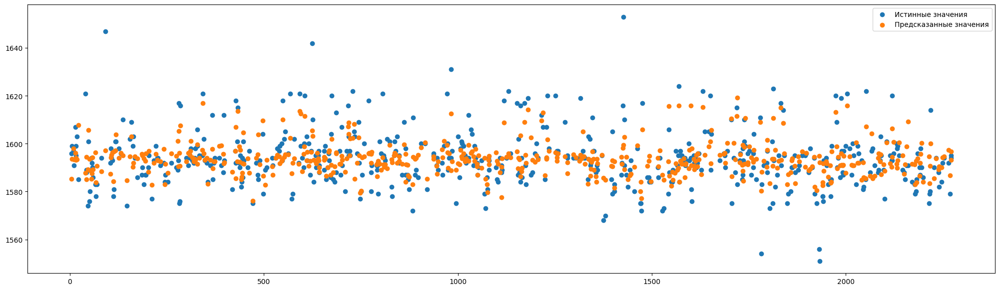

<Figure size 5000x1000 with 0 Axes>

In [365]:
# отобразим на графике таргеты тестовой выборки и предсказанные лучшей моделью значения:
predicted_test = pd.Series(predicted_test, index=target_test.index)
fig, ax = plt.subplots(figsize=(25, 7))
ax.scatter(x=target_test.index, y=target_test, label = "Истинные значения")
ax.scatter(x=predicted_test.index, y= predicted_test, label = "Предсказанные значения")
plt.figure(figsize=(50,10))
ax.legend()
plt.show()

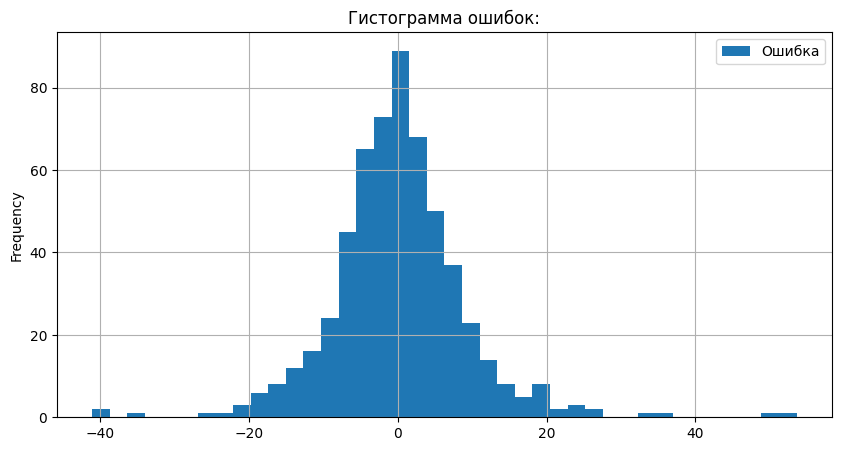

In [374]:
# построим гистограмму ошибок:
difference = target_test-predicted_test
difference.plot(kind='hist', label='Ошибка', grid=True, legend=True, title='Гистограмма ошибок:', figsize=(10,5), bins=40);

**Вывод:** Получена адекватная модель, MAE на тестовой выборке = 6,32, визуализация истинных ответов и предсказанных, а также близкий к нормальному вид распределения ошибок указают, что модель работает достаточно хорошо.

## 5. Анализ важности факторов

In [61]:
# объяснение прогнозов модели с помощью shap
explainer = shap.Explainer(model_lbr_set[1].best_estimator_)
shap_values = explainer(features_test[features_set[1]])

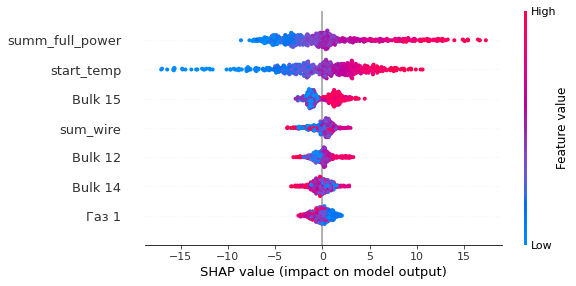

In [62]:
# график суммарного эффекта признаков:
shap.plots.beeswarm(shap_values)

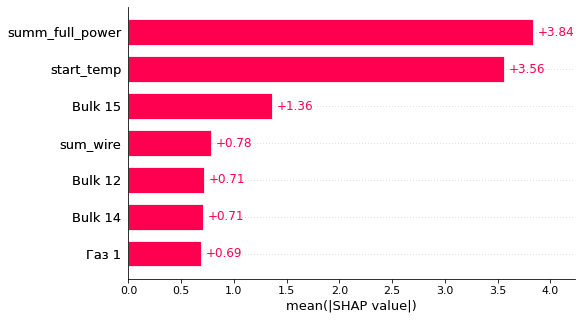

In [63]:
# гистограмма важности признаков
shap.plots.bar(shap_values)

**Выводы**:
    
    1) Самыми значимыми признаками является суммарная полная мощность и начальная температура
    2) Финальная температура увеличивается с увеличением суммарной полной мощности, начальной температуры и объемом сыпучих материалов Bulk 15
    3) Финальная температура уменьшается с увеличением объема потребляемого газа

## 6. Выводы

    1. Итоговая модель: LGBMRegressor, MAE на тестовой выборке: 6,32
    2. Список признаков, используемых для обучения лучшей модели: начальная температура, суммарная полная мощность, объем сыпучих веществ (Bulk 12, 14, 15), газ, сумма объмов проволочных материалов.

### Рекомендации для улучшения модели, решения :

    1) Более детальный анализ корректности данных (с учетом временных таблиц, которые мы не использовали)
    2) Определение дополнительных признаков и их исследование
    3) Рассмотрение других гиперпараметров моделей, исследование влияния гиперпараметров на качество предсказания
    4) Обучить другие модели
    5) Возможное изменение начальной задачи, а именно целевого признака